##TODO 3:Exploratory data analysis (EDA)

In [1]:
#import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
from scipy import stats
import pandas_profiling as pp

In [2]:
#load the dataset
winequality_df=pd.read_csv('https://raw.githubusercontent.com/NishaniKasineshan/Exploratory-Data-Analysis-on-winequality-dataset/main/winequality_red.csv',sep=',')
winequality_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
winequality_df.shape

(1599, 12)

In [4]:
winequality_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [ ]:
#Independent variable means its value cant be changed by the impact of any other variable
#Dependent variable means its value depends other variables
#In an experiment independent variables are the causes,dependent variable is the effect that is affected by the change
#In this dataset since we are expected to predict the wine quality the 'quality' variable becomes the dependent variable, other parameters that effect the wine quality will be the independent variables
''' 
  Independent variables: 
                        fixed acidity
                        volatile acidity
                        citric acid
                        residual sugar
                        chlorides
                        free sulfur dioxide
                        total sulphur dioxide
                        density
                        pH
                        sulphates
                        alcohol
  Dependent variables:
                        quality
''' 

In [5]:
#identify missing values(if any)
winequality_df.isnull().sum()

fixed acidity            0
volatile acidity        14
citric acid              0
residual sugar          12
chlorides                0
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       5
sulphates                0
alcohol                  0
quality                  0
dtype: int64

In [6]:
winequality_df[winequality_df['volatile acidity'].isnull()]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
45,4.6,NaN,0.15,2.1,0.054,8.0,65.0,0.99340,3.90,0.56,13.1,4
90,7.9,NaN,0.26,1.9,0.079,42.0,140.0,0.99640,3.23,0.54,9.5,5
151,9.2,NaN,1.00,3.4,0.610,32.0,69.0,0.99960,2.74,2.00,9.4,4
233,6.9,NaN,0.25,2.6,0.081,10.0,37.0,0.99685,3.46,0.50,11.0,5
414,8.8,NaN,0.34,2.7,0.087,24.0,122.0,0.99820,3.26,0.61,9.5,5
658,7.2,NaN,0.07,1.4,0.074,5.0,20.0,0.99730,3.32,0.81,9.6,6
660,7.2,NaN,0.07,1.4,0.074,5.0,20.0,0.99730,3.32,0.81,9.6,6
749,7.3,NaN,0.18,2.1,0.070,12.0,28.0,0.99768,3.52,0.73,9.5,6
808,7.4,NaN,0.12,1.9,0.165,4.0,12.0,0.99702,3.26,0.86,9.2,5
1066,6.6,NaN,0.08,2.4,0.070,13.0,26.0,0.99358,3.40,0.72,12.5,7


In [7]:
winequality_df[winequality_df['residual sugar'].isnull()]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
74,9.7,0.320,0.54,NaN,0.094,28.0,83.0,0.99840,3.28,0.82,9.6,5
108,8.0,0.330,0.53,NaN,0.091,18.0,80.0,0.99760,3.37,0.80,9.6,6
295,10.8,0.500,0.46,NaN,0.073,5.0,27.0,1.00010,3.05,0.64,9.5,5
334,7.9,0.650,0.01,NaN,0.078,17.0,38.0,0.99630,3.34,0.74,11.7,7
497,7.2,0.340,0.32,NaN,0.090,43.0,113.0,0.99660,3.32,0.79,11.1,5
527,7.0,0.380,0.49,NaN,0.097,33.0,85.0,0.99620,3.39,0.77,11.4,6
630,8.7,0.540,0.26,NaN,0.097,7.0,31.0,0.99760,3.27,0.60,9.3,6
670,6.9,0.400,0.24,NaN,0.083,30.0,45.0,0.99590,3.26,0.58,10.0,5
771,9.4,0.685,0.26,NaN,0.082,23.0,143.0,0.99780,3.28,0.55,9.4,5
863,7.2,0.620,0.06,NaN,0.078,17.0,84.0,0.99746,3.51,0.53,9.7,5


In [8]:
winequality_df[winequality_df['pH'].isnull()]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
310,10.3,0.53,0.48,2.5,0.063,6.0,25.0,0.99980,NaN,0.59,9.3,6
339,12.5,0.28,0.54,2.3,0.082,12.0,29.0,0.99970,NaN,1.36,9.8,7
344,11.9,0.57,0.50,2.6,0.082,6.0,32.0,1.00060,NaN,0.78,10.7,6
1100,8.4,0.34,0.42,2.1,0.072,23.0,36.0,0.99392,NaN,0.78,12.4,6
1123,10.7,0.40,0.37,1.9,0.081,17.0,29.0,0.99674,NaN,0.65,11.2,6


In [ ]:
'''
Handling missing values in ML
1. If the dataset is large enough we can drop that null data
2. If the dataset is small and somehow there may be an issue that the data is missing there and the missing values at random data points we replace the null values either with mean or median or 0 with respective to their domain
3. We can apply a linear interpolation method to make value predictions on these missing values and replace them
''' 

In [9]:
winequality_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1585.000000,1599.000000,1587.000000,1599.000000,1599.000000,1599.000000,1599.000000,1594.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527877,0.270976,2.539225,0.087467,15.874922,46.467792,0.996747,3.311725,0.658149,10.422983,5.636023
std,1.741096,0.179848,0.194801,1.415240,0.047065,10.460157,32.895324,0.001887,0.154240,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [10]:
#find the percentage of missing values with the total data rows
missing_value_percent=(winequality_df.isnull().sum()/winequality_df.shape[0])*100
print(missing_value_percent)

fixed acidity           0.000000
volatile acidity        0.875547
citric acid             0.000000
residual sugar          0.750469
chlorides               0.000000
free sulfur dioxide     0.000000
total sulfur dioxide    0.000000
density                 0.000000
pH                      0.312695
sulphates               0.000000
alcohol                 0.000000
quality                 0.000000
dtype: float64


In [11]:
#since the dataset is small,
#if we drop the data rows it will reuce the size of the dataset
#we actually can replace the values with 0 and the mean value of the particular column
winequality_df['volatile acidity']=winequality_df['volatile acidity'].replace(np.NaN,0.0)
winequality_df['residual sugar']=winequality_df['residual sugar'].replace(np.NaN,0.0)
winequality_df['pH']=winequality_df['pH'].replace(np.NaN,winequality_df['pH'].mean())

In [12]:
winequality_df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [13]:
winequality_df.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [16]:
winequality_df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.237106,0.671703,0.112595,0.093705,-0.153794,-0.113181,0.668047,-0.679138,0.183006,-0.061668,0.124052
volatile acidity,-0.237106,1.000000,-0.531233,0.013958,0.042069,-0.011164,0.070920,0.022262,0.223691,-0.267150,-0.191205,-0.370294
citric acid,0.671703,-0.531233,1.000000,0.137522,0.203823,-0.060978,0.035533,0.364947,-0.539361,0.312770,0.109903,0.226373
residual sugar,0.112595,0.013958,0.137522,1.000000,0.054712,0.176997,0.192451,0.348018,-0.084899,0.005451,0.043422,0.014412
chlorides,0.093705,0.042069,0.203823,0.054712,1.000000,0.005562,0.047400,0.200632,-0.266660,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.011164,-0.060978,0.176997,0.005562,1.000000,0.667666,-0.021946,0.069422,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.070920,0.035533,0.192451,0.047400,0.667666,1.000000,0.071269,-0.068623,0.042947,-0.205654,-0.185100
density,0.668047,0.022262,0.364947,0.348018,0.200632,-0.021946,0.071269,1.000000,-0.339656,0.148506,-0.496180,-0.174919
pH,-0.679138,0.223691,-0.539361,-0.084899,-0.266660,0.069422,-0.068623,-0.339656,1.000000,-0.192950,0.207141,-0.055069
sulphates,0.183006,-0.267150,0.312770,0.005451,0.371260,0.051658,0.042947,0.148506,-0.192950,1.000000,0.093595,0.251397


<Axes: >

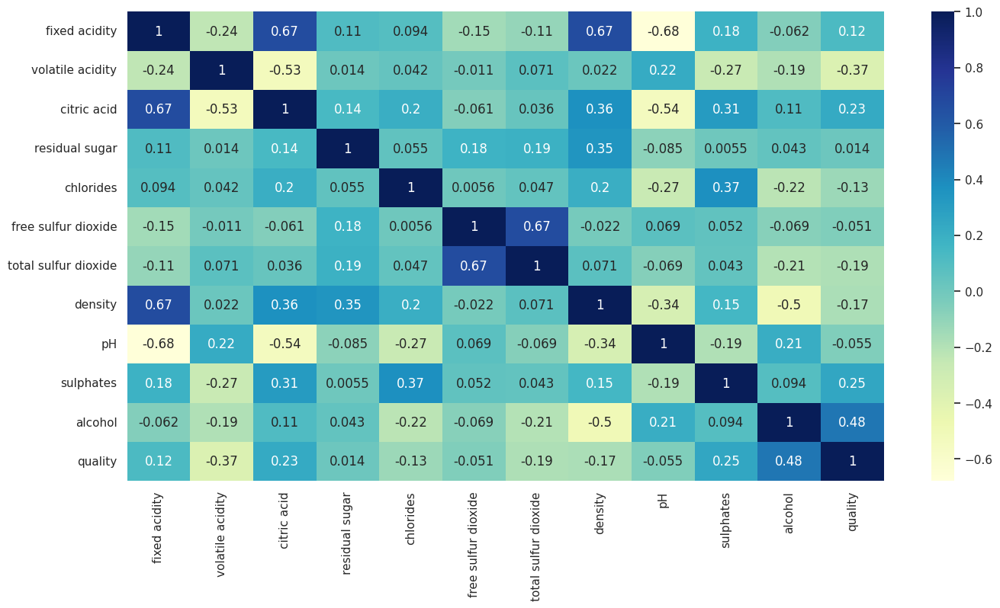

In [17]:
sns.set(rc = {'figure.figsize':(16,8)})
sns.heatmap(winequality_df.corr(), annot = True, fmt='.2g',cmap= 'YlGnBu')

In [ ]:
#from above heatmap it can be seen that alcohol shows large correlation with quality
'''
Highly positively correlated attributes with the quality of the wine:
                          alcohol
                          sulphates
                          citric acid
Highly negatively correlated attributes with the quality of the wine: 
                          volatile acidity                 
'''

Text(0, 0.5, 'alcohol')

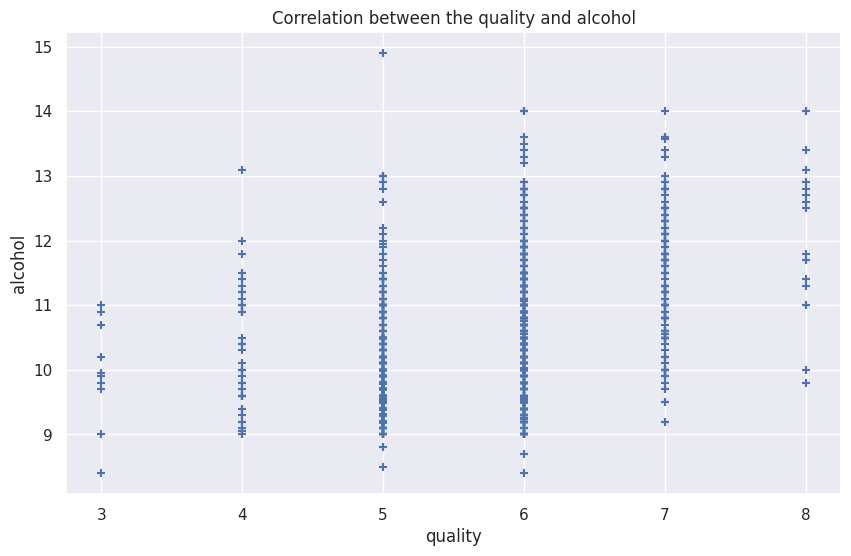

In [18]:
#visulize correlation between alcohol and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['alcohol'], marker='+')
plt.title('Correlation between the quality and alcohol')
plt.xlabel('quality')
plt.ylabel('alcohol')

Text(0, 0.5, 'sulphates')

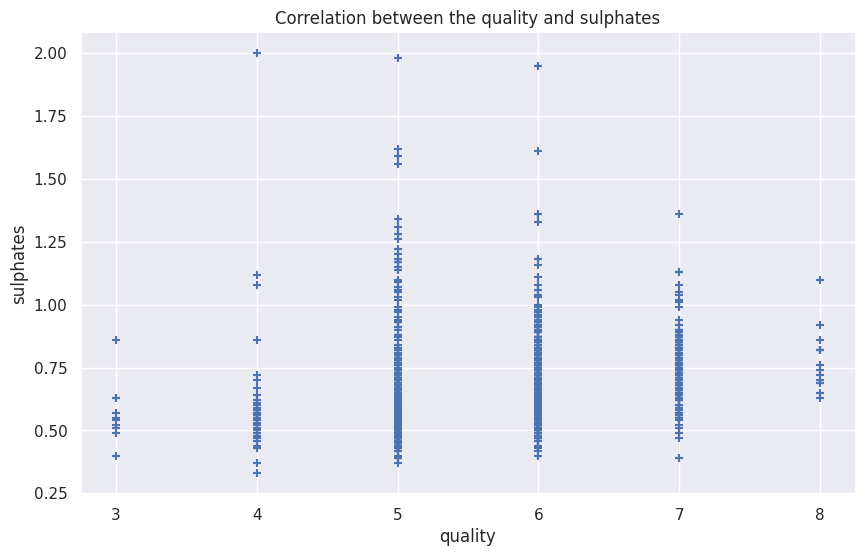

In [19]:
#visulize correlation between sulphates and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['sulphates'], marker='+')
plt.title('Correlation between the quality and sulphates')
plt.xlabel('quality')
plt.ylabel('sulphates')

Text(0, 0.5, 'citric acid')

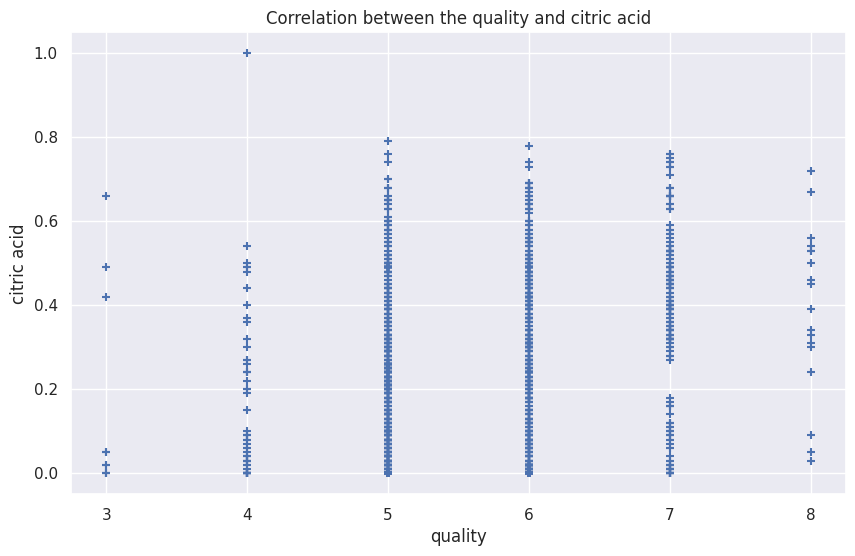

In [20]:
#visulize correlation between the citric acid and quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['citric acid'], marker='+')
plt.title('Correlation between the quality and citric acid')
plt.xlabel('quality')
plt.ylabel('citric acid')

Text(0, 0.5, 'fixed acidity')

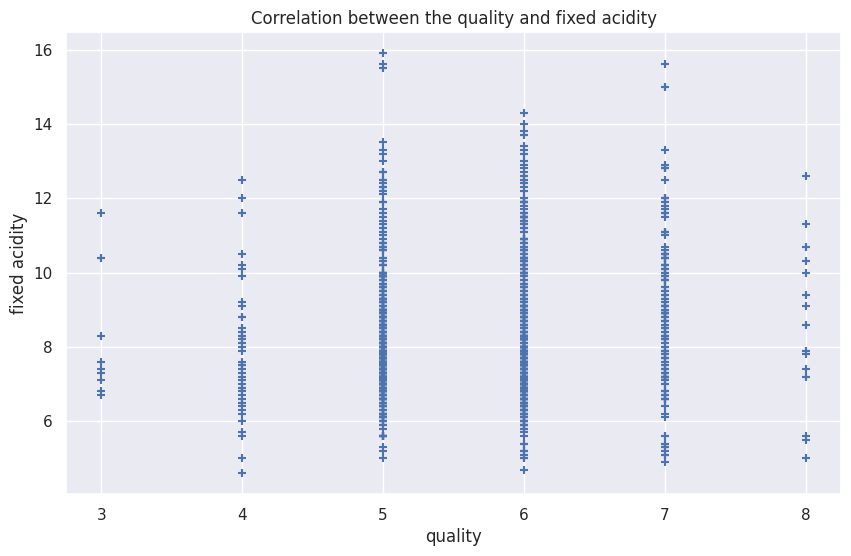

In [21]:
#visulize correlation between fixed acidity and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['fixed acidity'], marker='+')
plt.title('Correlation between the quality and fixed acidity')
plt.xlabel('quality')
plt.ylabel('fixed acidity')

Text(0, 0.5, 'volatile acidity')

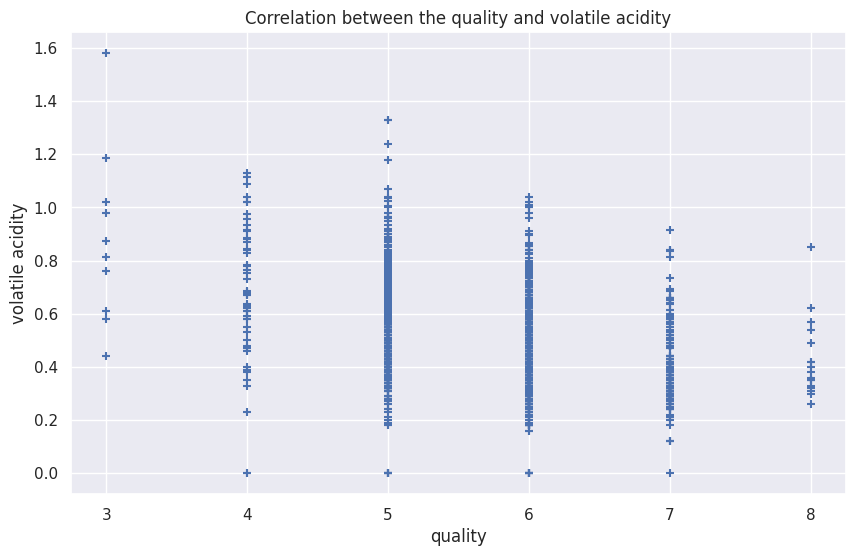

In [22]:
#visulize correlation between volatile acidity and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['volatile acidity'], marker='+')
plt.title('Correlation between the quality and volatile acidity')
plt.xlabel('quality')
plt.ylabel('volatile acidity')

Text(0, 0.5, 'residual sugar')

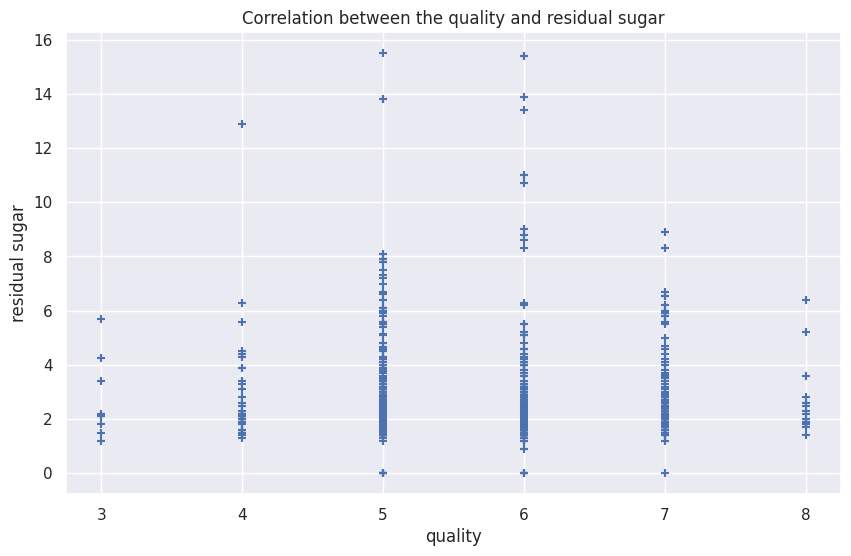

In [23]:
#visulize correlation between residual sugar and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['residual sugar'], marker='+')
plt.title('Correlation between the quality and residual sugar')
plt.xlabel('quality')
plt.ylabel('residual sugar')

Text(0, 0.5, 'pH')

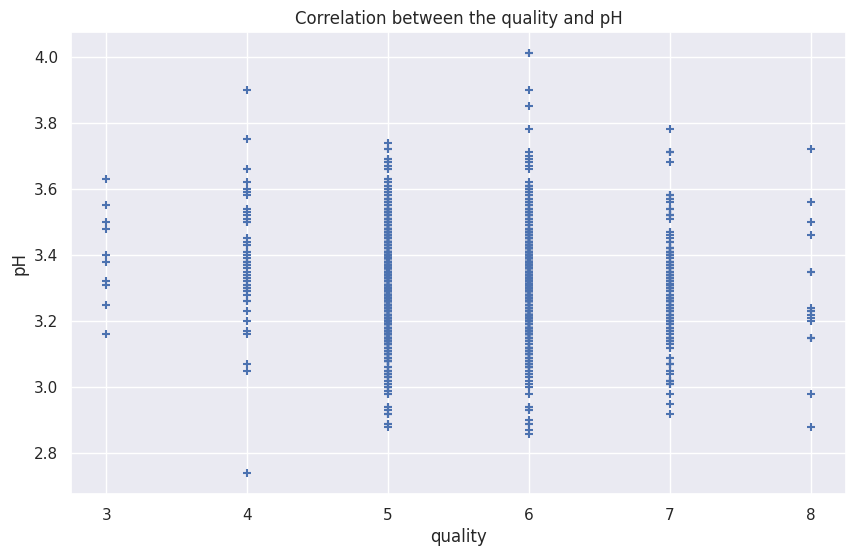

In [24]:
#visulize correlation between pH and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['pH'], marker='+')
plt.title('Correlation between the quality and pH')
plt.xlabel('quality')
plt.ylabel('pH')

Text(0, 0.5, 'free sulfur dioxide')

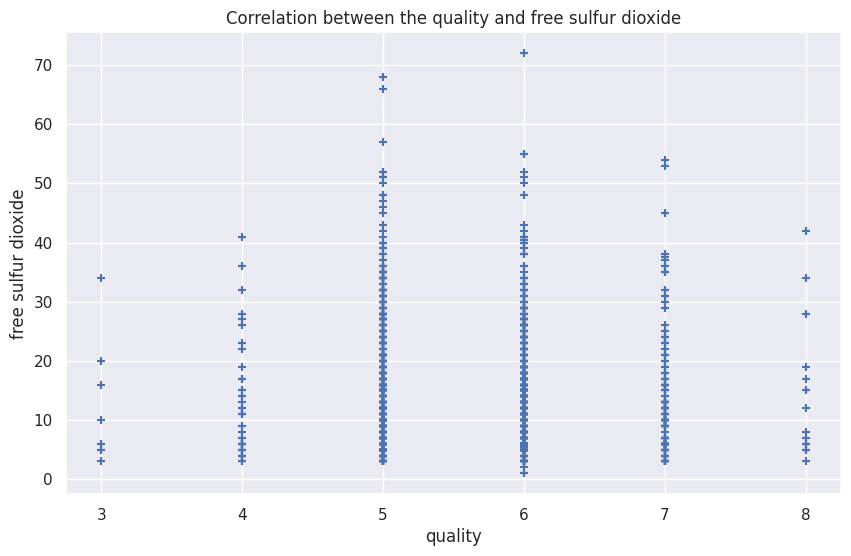

In [25]:
#visulize correlation between free sulfur dioxide and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['free sulfur dioxide'], marker='+')
plt.title('Correlation between the quality and free sulfur dioxide')
plt.xlabel('quality')
plt.ylabel('free sulfur dioxide')

Text(0, 0.5, 'total sulfur dioxide')

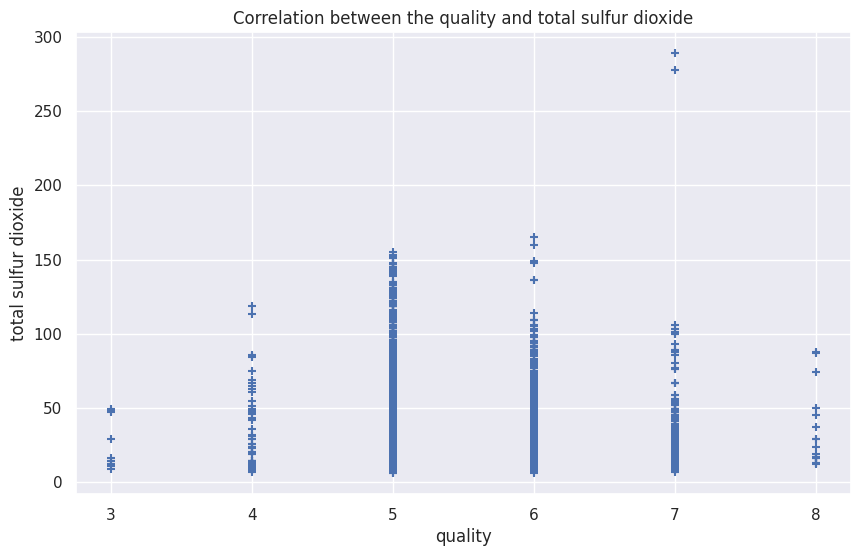

In [26]:
#visulize correlation between total sulfur dioxide and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['total sulfur dioxide'], marker='+')
plt.title('Correlation between the quality and total sulfur dioxide')
plt.xlabel('quality')
plt.ylabel('total sulfur dioxide')

Text(0, 0.5, 'density')

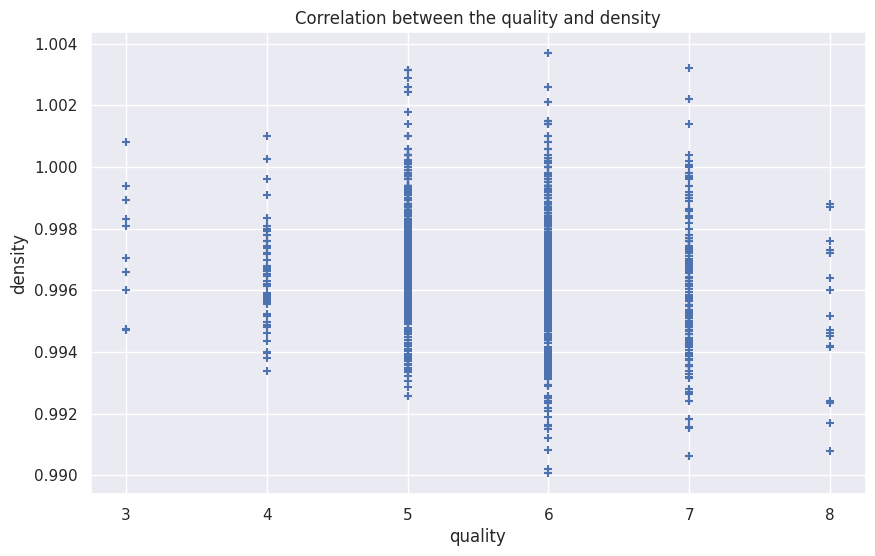

In [27]:
#visulize correlation between density and the quality
plt.figure(figsize=(10, 6))
plt.scatter(winequality_df['quality'], winequality_df['density'], marker='+')
plt.title('Correlation between the quality and density')
plt.xlabel('quality')
plt.ylabel('density')

In [38]:
winequality_df.columns[0]

'fixed acidity'

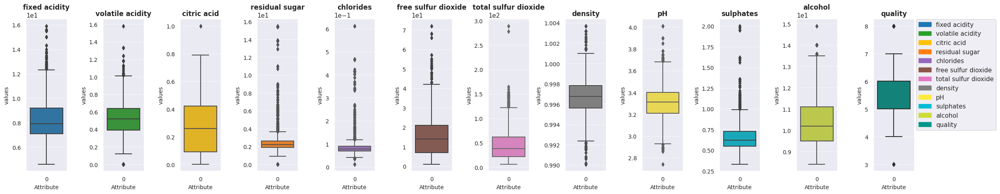

In [86]:
fig,axes=plt.subplots(1,12,figsize=(25,5))

colors=['#1f77b4','#2ca02c','#ffc107','#ff7f0e','#9467bd','#8c564b','#e377c2','#7f7f7f','#ffeb3b','#00bcd4','#cddc39','#009688']
patches=[]
for i in range(winequality_df.shape[1]):

  ax=plt.subplot(1,12,i+1)
  sns.boxplot(winequality_df[winequality_df.columns[i]],color=colors[i])
  patches.append(mpatches.Patch(color=colors[i], label=winequality_df.columns[i]))
  ax.set_title(winequality_df.columns[i],fontsize=12,fontweight='bold')
  ax.set_xlabel('Attribute',fontsize=10)
  ax.set_ylabel('values',fontsize=10)
  ax.tick_params(axis='both',which='major',labelsize=10)
  ax.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
  sns.despine(top=True,right=True)
  ax.grid(axis='y',linestyle='--',alpha=0.7)

plt.legend(handles=patches,bbox_to_anchor=(1.05, 1),loc='upper left', borderaxespad=0.)
plt.tight_layout()

In [89]:
copy_winequality_df=winequality_df
copy_winequality_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [91]:
#standardizing the values
for i in copy_winequality_df.columns:
  copy_winequality_df[i]=stats.zscore(copy_winequality_df[i])
copy_winequality_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,-0.528360,0.952113,-1.391472,-0.434776,-0.243707,-0.466193,-0.379133,0.558274,1.287912,-0.579207,-0.960246,-0.787823
1,-0.298547,1.921761,-1.391472,0.055966,0.223875,0.872638,0.624363,0.028261,-0.725721,0.128950,-0.584777,-0.787823
2,-0.298547,1.275329,-1.186070,-0.154352,0.096353,-0.083669,0.229047,0.134264,-0.335986,-0.048089,-0.584777,-0.787823
3,1.654856,-1.310399,1.484154,-0.434776,-0.264960,0.107592,0.411500,0.664277,-0.985545,-0.461180,-0.584777,0.450848
4,-0.528360,0.952113,-1.391472,-0.434776,-0.243707,-0.466193,-0.379133,0.558274,1.287912,-0.579207,-0.960246,-0.787823
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,-1.217796,0.413419,-0.980669,-0.364670,0.053845,1.542054,-0.075043,-0.978765,0.898176,-0.461180,0.072294,-0.787823
1595,-1.390155,0.144073,-0.877968,-0.224458,-0.541259,2.211469,0.137820,-0.862162,1.352868,0.601055,0.729364,0.450848
1596,-1.160343,-0.071405,-0.723916,-0.154352,-0.243707,1.255161,-0.196679,-0.533554,0.703309,0.542042,0.541630,0.450848
1597,-1.390155,0.655831,-0.775267,-0.364670,-0.264960,1.542054,-0.075043,-0.676657,1.677647,0.305990,-0.209308,-0.787823


In [92]:
copy_winequality_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03
mean,3.554936e-16,-2.666202e-16,-8.887339e-17,-3.999302e-17,3.732682e-16,-6.221137e-17,4.443669e-17,-3.473172e-14,1.972989e-15,6.754377e-16,1.066481e-16,8.887339e-17
std,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00
min,-2.137045e+00,-2.818741e+00,-1.391472e+00,-1.766792e+00,-1.603945e+00,-1.422500e+00,-1.230584e+00,-3.538731e+00,-3.713693e+00,-1.936507e+00,-1.898919e+00,-3.265165e+00
25%,-7.007187e-01,-7.178367e-01,-9.293181e-01,-4.347761e-01,-3.712290e-01,-8.487156e-01,-7.440403e-01,-6.077557e-01,-6.607654e-01,-6.382196e-01,-8.663789e-01,-7.878226e-01
50%,-2.410944e-01,-1.753533e-02,-5.636026e-02,-2.244578e-01,-1.799455e-01,-1.793002e-01,-2.574968e-01,1.760083e-03,-1.120632e-02,-2.251281e-01,-2.093081e-01,4.508484e-01
75%,5.057952e-01,6.288967e-01,7.652471e-01,5.596649e-02,5.384542e-02,4.901152e-01,4.723184e-01,5.768249e-01,5.733968e-01,4.240158e-01,6.354971e-01,4.508484e-01
max,4.355149e+00,5.692614e+00,3.743574e+00,9.099651e+00,1.112703e+01,5.367284e+00,7.375154e+00,3.680055e+00,4.535707e+00,7.918677e+00,4.202453e+00,2.928190e+00


In [100]:
pp.ProfileReport(winequality_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]